<a href="https://colab.research.google.com/github/HARSHIT097/Time-Series-Data-Analysis/blob/main/Tata_power_assignment_analysis_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import datetime as dt
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

# Loading Data and Basic exploration of data

In [2]:
from google.colab import files
files.upload()

Saving data_description.csv to data_description.csv
Saving test_dataset.csv to test_dataset.csv


{'data_description.csv': b'\xef\xbb\xbfVariable|Descriptiion\r\ndate_time|Date of record entry mm/dd/yyyy hh:mm:ss\r\nRY VOLTAGE|Line voltag between 2 phases of polyphase system\r\nYB VOLTAGE|Line voltag between 2 phases of polyphase system\r\nBR VOLTAGE|Line voltag between 2 phases of polyphase system\r\nR PHASE CURRENT|single phase current\r\nY PHASE CURRENT|single phase current\r\nB PHASE CURRENT|single phase current\r\nPF|power factor\r\n FREQUENCY|frequency\r\nAPPARENT POWER|Combination of active and reactive power\r\nACTIVE POWER|Wats\r\nREACTIVE POWER|kVAR \r\nTODAY EXPORT|Export of power to grid for day till now\r\nTODAY IMPORT|impot of power from grid for day till now\r\nTOTAL EXPORT|Total power exported to grid\r\nTOTAL IMPORT|total power imported from grid\r\nHORIZONTAL RADIATION|Irradiance on horizonta surface\r\nTILT_RADIATION|Radiation measured based on fixed tilt\r\nDAY HORIZONTAL RADIATION|mean day radiation on horizontal surface\r\nDAY TILT RADIATION|mean day radiation

In [3]:
data_desc = pd.read_csv("/content/data_description.csv", sep="|")
data_desc

,Variable,Descriptiion
0,date_time,Date of record entry mm/dd/yyyy hh:mm:ss
1,RY VOLTAGE,Line voltag between 2 phases of polyphase system
2,YB VOLTAGE,Line voltag between 2 phases of polyphase system
3,BR VOLTAGE,Line voltag between 2 phases of polyphase system
4,R PHASE CURRENT,single phase current
5,Y PHASE CURRENT,single phase current
6,B PHASE CURRENT,single phase current
7,PF,power factor
8,FREQUENCY,frequency
9,APPARENT POWER,Combination of active and reactive power


In [12]:
data = pd.read_csv("/content/test_dataset.csv")
data.head(10)

,date_time,RY VOLTAGE,YB VOLTAGE,BR VOLTAGE,R PHASE CURRENT,Y PHASE CURRENT,B PHASE CURRENT,PF,FREQUENCY,APPARENT POWER,ACTIVE POWER,REACTIVE POWER,TODAY EXPORT,TODAY IMPORT,TOTAL EXPORT,TOTAL IMPORT,HORIZONTAL RADIATION,TILT_RADIATION,DAY HORIZONTAL RADIATION,DAY TILT RADIATION,MODULE TEMPERATURE,AMBIENT TEMPERATURE,WIND SPEED,WIND DIRECTION,HUMIDITY,RAIN
0,1/1/2020 0:00,68759.56641,68742.19531,68300.51563,2.1605,1.9296,2.5329,-0.204,100.098999,129.770001,-79.580002,-27.380005,309500.0,400.0,50321700.0,104700.0,0.0,0.000000,9.379745,10.732933,17.000000,20.500000,1.5,84.199997,85.699997,0.0
1,1/1/2020 0:10,68302.45703,68265.07031,67853.40625,2.1000,1.8774,2.4804,-0.044,99.993000,125.780003,-77.770001,-6.419998,0.0,0.0,50321700.0,104700.0,0.0,0.000000,9.379745,10.732933,17.200001,20.600000,0.7,76.099998,86.000000,0.0
2,1/1/2020 0:20,68210.21484,68185.65234,67773.36328,2.0753,1.8809,2.4350,-0.024,99.968998,124.340000,-76.830002,-3.380001,0.0,0.0,50321700.0,104700.0,0.0,0.000000,0.000000,0.000000,17.200001,20.700001,0.9,92.800003,86.000000,0.0
3,1/1/2020 0:30,68324.65234,68296.44141,67882.87891,2.0419,1.8650,2.4225,-0.021,100.057003,123.510002,-76.010002,-5.330002,0.0,0.0,50321700.0,104700.0,0.0,0.000000,0.000000,0.000000,16.900000,20.500000,0.7,68.000000,86.400002,0.0
4,1/1/2020 0:40,68393.61719,68388.14453,67939.93750,2.0887,1.9138,2.4445,-0.059,100.033001,125.800003,-76.989998,-9.790001,0.0,0.0,50321700.0,104700.0,0.0,0.000000,0.000000,0.000000,16.700001,20.400000,0.7,92.400002,87.199997,0.0
5,1/1/2020 0:50,68468.92969,68459.64063,68018.52734,2.0983,1.9021,2.4697,-0.086,100.026001,126.440002,-77.150002,-13.689999,0.0,0.0,50321700.0,104700.0,0.0,0.000000,0.000000,0.000000,16.900000,20.200001,0.8,102.000000,87.400002,0.0
6,1/1/2020 1:00,68579.20703,68560.01563,68128.00000,2.0828,1.9222,2.4385,-0.068,100.207001,126.090004,-76.990002,-11.579998,0.0,0.0,50321700.0,104700.0,0.0,0.000000,0.000000,0.000000,16.900000,20.299999,1.0,91.800003,87.400002,0.0
7,1/1/2020 1:10,68445.83984,68394.59766,67993.28906,2.0695,1.8554,2.4399,-0.067,100.046997,124.309997,-76.980000,-11.000000,0.0,0.0,50321700.0,104700.0,0.0,0.000000,0.000000,0.000000,16.799999,20.000000,0.7,128.899994,88.099998,0.0
8,1/1/2020 1:20,68522.01563,68493.76953,68067.86719,2.0859,1.8754,2.4597,-0.098,100.042999,125.459999,-76.590000,-14.550003,0.0,100.0,50321700.0,104800.0,2.4,2.133333,0.000000,0.000000,17.700001,20.100000,0.8,111.699997,88.500000,0.0
9,1/1/2020 1:30,68550.19141,68527.51563,68085.10938,2.0889,1.9201,2.4603,-0.125,100.016003,126.430001,-76.840000,-17.380001,0.0,100.0,50321700.0,104800.0,2.4,2.026667,0.000000,0.000000,18.299999,20.400000,0.9,77.599998,88.599998,0.0


In [19]:
#reading the column as date time format
data['date_time'] = data['date_time'].astype('datetime64[ns]')
data.set_index("date_time", inplace = True)

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 61071 entries, 2020-01-01 00:00:00 to 2021-01-20 23:50:00
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   RY VOLTAGE                61070 non-null  float64
 1   YB VOLTAGE                61070 non-null  float64
 2   BR VOLTAGE                61070 non-null  float64
 3   R PHASE CURRENT           61070 non-null  float64
 4   Y PHASE CURRENT           61070 non-null  float64
 5   B PHASE CURRENT           61070 non-null  float64
 6   PF                        61070 non-null  float64
 7    FREQUENCY                61070 non-null  float64
 8   APPARENT POWER            61070 non-null  float64
 9   ACTIVE POWER              61070 non-null  float64
 10  REACTIVE POWER            61070 non-null  float64
 11  TODAY EXPORT              61070 non-null  float64
 12  TODAY IMPORT              61070 non-null  float64
 13  TOTAL EXPORT              

In [21]:
data.head(2)

,RY VOLTAGE,YB VOLTAGE,BR VOLTAGE,R PHASE CURRENT,Y PHASE CURRENT,B PHASE CURRENT,PF,FREQUENCY,APPARENT POWER,ACTIVE POWER,REACTIVE POWER,TODAY EXPORT,TODAY IMPORT,TOTAL EXPORT,TOTAL IMPORT,HORIZONTAL RADIATION,TILT_RADIATION,DAY HORIZONTAL RADIATION,DAY TILT RADIATION,MODULE TEMPERATURE,AMBIENT TEMPERATURE,WIND SPEED,WIND DIRECTION,HUMIDITY,RAIN
date_time,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,68759.56641,68742.19531,68300.51563,2.1605,1.9296,2.5329,-0.204,100.098999,129.770001,-79.580002,-27.380005,309500.0,400.0,50321700.0,104700.0,0.0,0.0,9.379745,10.732933,17.000000,20.5,1.5,84.199997,85.699997,0.0
2020-01-01 00:10:00,68302.45703,68265.07031,67853.40625,2.1000,1.8774,2.4804,-0.044,99.993000,125.780003,-77.770001,-6.419998,0.0,0.0,50321700.0,104700.0,0.0,0.0,9.379745,10.732933,17.200001,20.6,0.7,76.099998,86.000000,0.0


In [22]:
data.columns

Index(['RY VOLTAGE', 'YB VOLTAGE', 'BR VOLTAGE', 'R PHASE CURRENT',
       'Y PHASE CURRENT', 'B PHASE CURRENT', 'PF', ' FREQUENCY',
       'APPARENT POWER', 'ACTIVE POWER', 'REACTIVE POWER', 'TODAY EXPORT',
       'TODAY IMPORT', 'TOTAL EXPORT', 'TOTAL IMPORT', 'HORIZONTAL RADIATION',
       'TILT_RADIATION', 'DAY HORIZONTAL RADIATION', 'DAY TILT RADIATION',
       'MODULE TEMPERATURE', 'AMBIENT TEMPERATURE', 'WIND SPEED',
       'WIND DIRECTION', 'HUMIDITY', 'RAIN'],
      dtype='object')

In [23]:
data.describe()

,RY VOLTAGE,YB VOLTAGE,BR VOLTAGE,R PHASE CURRENT,Y PHASE CURRENT,B PHASE CURRENT,PF,FREQUENCY,APPARENT POWER,ACTIVE POWER,REACTIVE POWER,TODAY EXPORT,TODAY IMPORT,TOTAL EXPORT,TOTAL IMPORT,HORIZONTAL RADIATION,TILT_RADIATION,DAY HORIZONTAL RADIATION,DAY TILT RADIATION,MODULE TEMPERATURE,AMBIENT TEMPERATURE,WIND SPEED,WIND DIRECTION,HUMIDITY,RAIN
count,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,6.107000e+04,61070.000000,6.107000e+04,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000,61070.000000
mean,68520.677738,68417.572541,68006.362330,231.341406,230.821334,230.932071,-0.487763,99.552633,13502.623738,13359.112601,-628.605693,1.247237e+05,327.226134,8.282879e+07,186821.706239,215.985609,229.842972,2.607516,2.769352,28.417017,25.802995,2.387162,175.196347,66.902132,0.000164
std,4687.411699,4706.444548,4645.515323,312.230323,312.207537,311.959227,1.227029,6.579384,18180.995182,18250.080619,987.051838,2.787905e+06,6333.322961,1.813716e+07,48521.440686,314.511718,328.434546,2.529983,2.693212,11.260193,4.879702,13.332223,93.015805,21.739088,0.006573
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.999000,0.000000,0.000000,-222.029999,-3257.920044,-1.059524e+08,-252200.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,67882.188478,67697.270505,67396.717770,2.723800,2.198900,2.908950,-1.996000,99.938004,154.539997,-82.480003,-700.310005,0.000000e+00,200.000000,6.880803e+07,147100.000000,0.000000,0.000000,0.000000,0.000000,20.600000,22.700001,1.200000,79.900002,51.900002,0.000000
50%,68931.015630,68859.798830,68418.888675,5.697100,4.691400,5.213250,-0.220500,100.021000,317.904999,0.000000,-152.230004,7.160000e+04,200.000000,8.530040e+07,191100.000000,4.533333,4.480000,2.142360,2.257321,24.299999,25.500000,2.100000,202.399994,69.000000,0.000000
75%,69933.377933,69888.447268,69414.827150,455.673646,454.985140,454.717594,0.528000,100.083000,26720.405517,26713.572755,-33.112498,1.526000e+05,300.000000,9.754740e+07,227300.000000,362.306679,397.226654,5.056238,5.268755,36.299999,29.200001,3.200000,256.399994,85.699997,0.000000
max,72238.816410,72266.535160,71658.269530,892.824982,892.709992,892.590393,2.000000,100.654003,52949.718750,52852.369140,149.290001,8.629850e+07,193900.000000,1.125460e+08,269700.000000,1413.493408,1437.440063,13.493360,14.782917,64.099998,39.500000,3276.699951,3276.699951,100.000000,0.600000


In [ ]:
# Line graph dump as png
# corr(Active Power)
# Line Plot active power vs all


In [123]:
def Scatter_Plot_DatetimevsAll(input_col_name,input_col_data):
  #input_col.plot(kind='kde')
  matplotlib.pyplot.figure(figsize=(15, 5), dpi=80)
  plt.scatter(x=input_col_data.index,y=input_col_data.values,s=4)
  plt.xlabel("Date Time")  # add X-axis label
  plt.ylabel(input_col_name)  # add Y-axis label
  plt.title(f"Date Time vs {input_col_name}")  # add title
  plt.savefig(f'/content/Scatter_Plot_Date_Time_Vs_All/Scatter_Plot_Date_Time_Vs_{input_col_name}')
  #plt.savefig(f'Scatter_Plot_Date_Time_Vs_{input_col_name}')
  #plt.show()

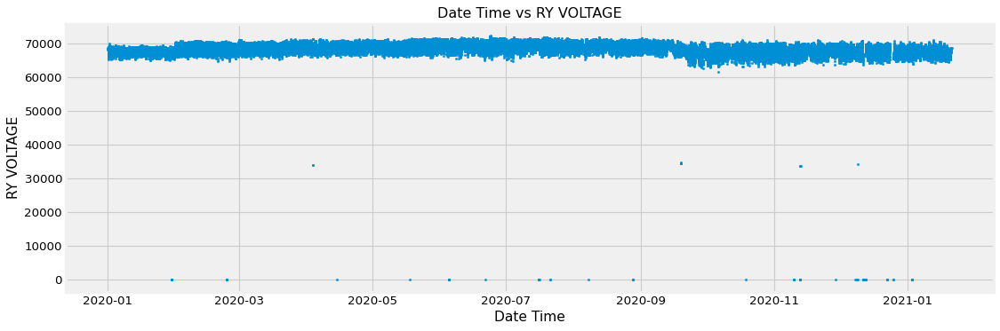

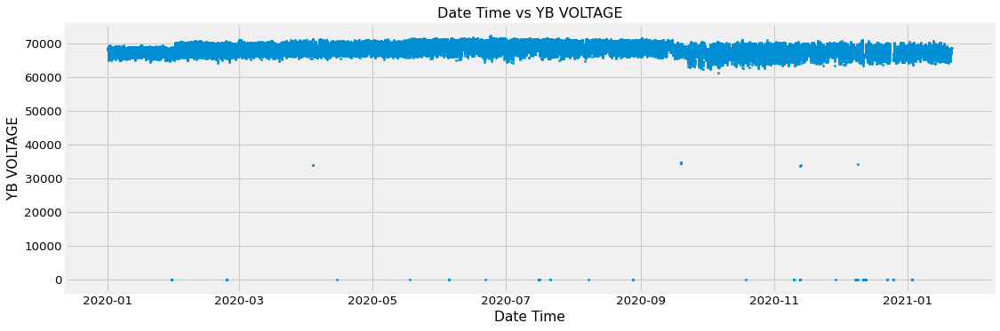

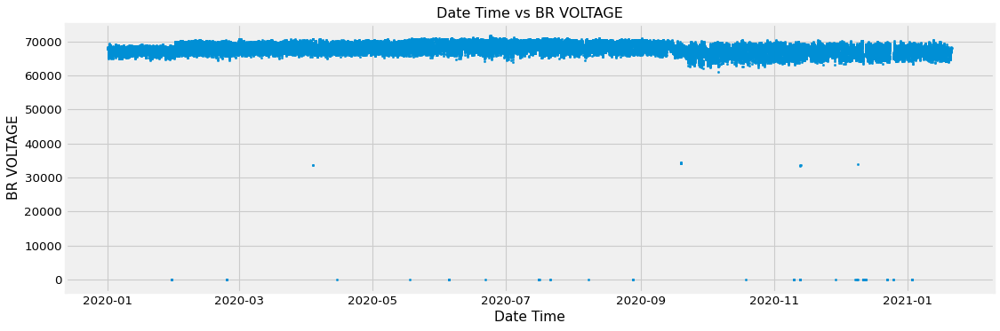

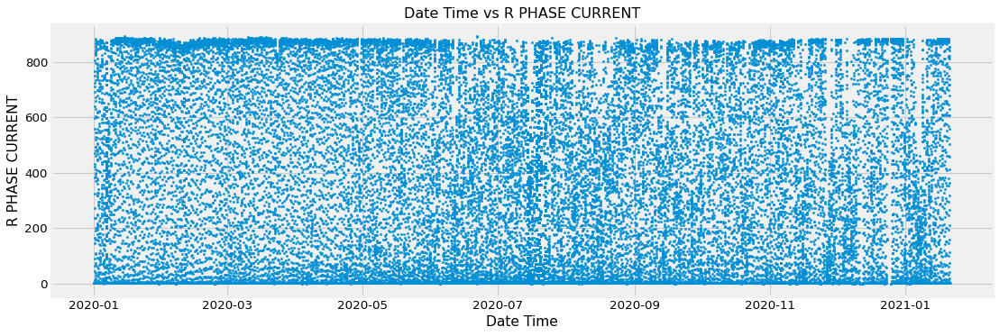

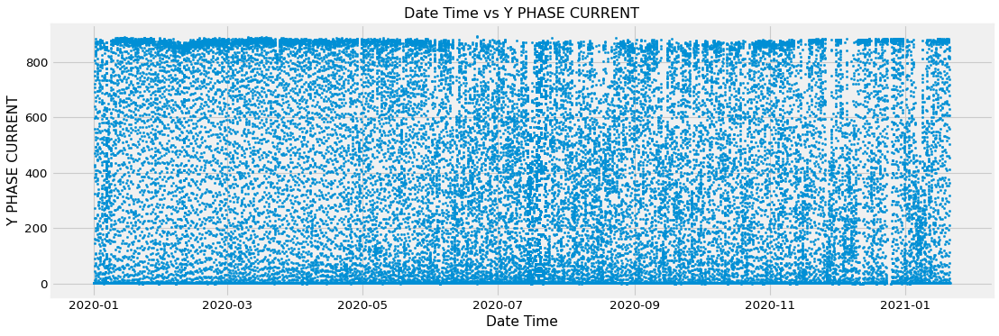

...

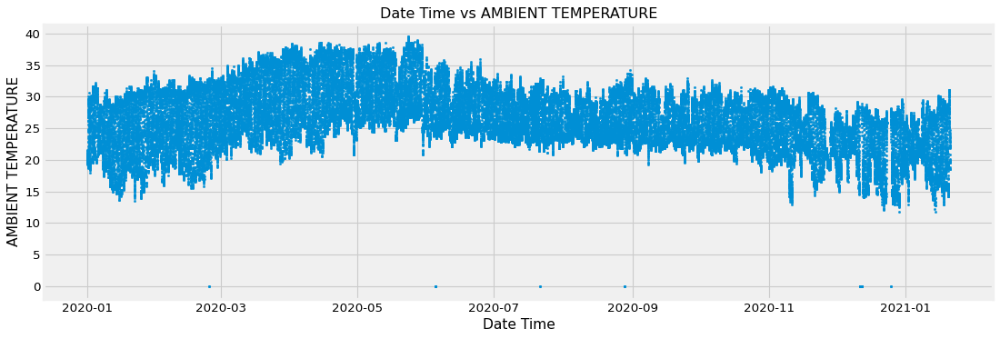

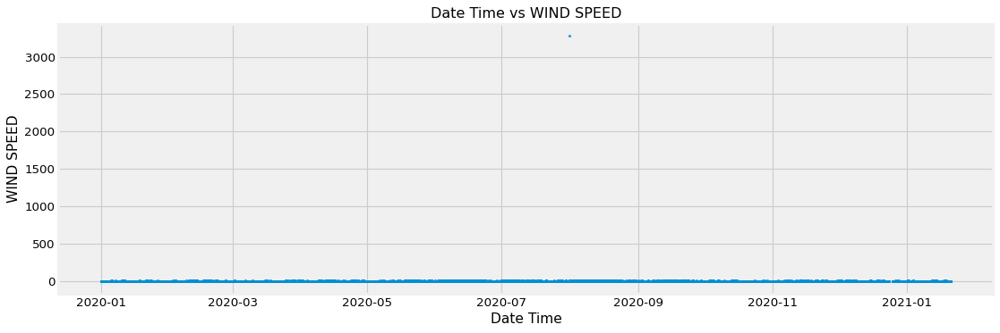

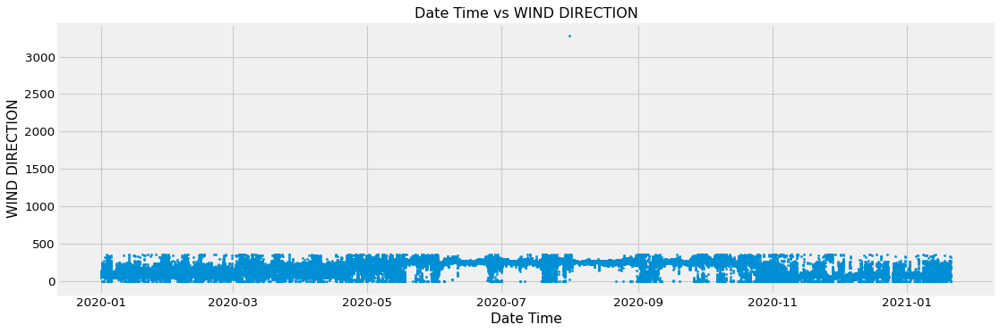

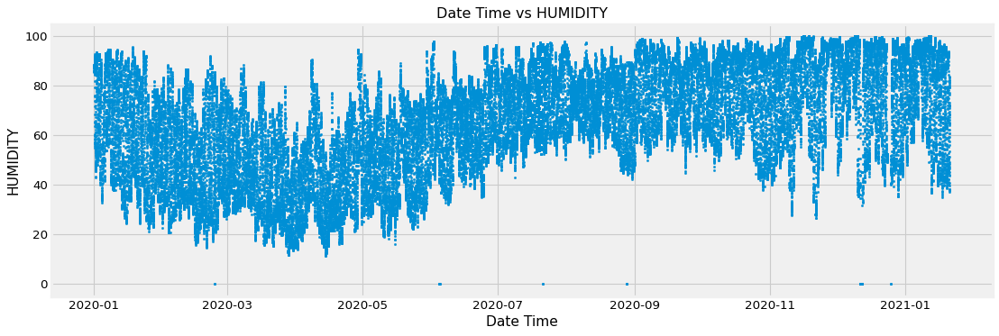

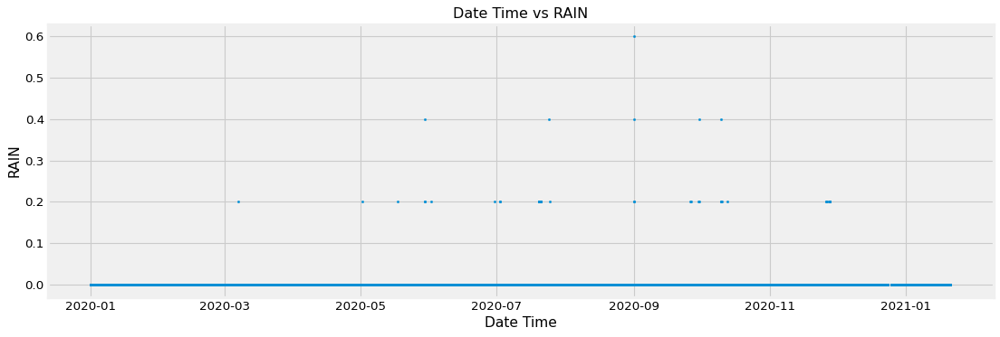

In [124]:
for col_name in data.columns:
  Scatter_Plot_DatetimevsAll(col_name,data[col_name])

In [128]:
def Scatter_Plot_ActivePowervsAll(input_col_name,active_power,input_col_data):
  #input_col.plot(kind='kde')
  matplotlib.pyplot.figure(figsize=(15, 5), dpi=80)
  plt.scatter(x=active_power,y=input_col_data.values,s=4)
  plt.xlabel("Active Power")  # add X-axis label
  plt.ylabel(input_col_name)  # add Y-axis label
  plt.title(f"Active Power vs {input_col_name}")  # add title
 
  plt.savefig(f'/content/Scatter_Plot_Active_Vs_All/Scatter_Plot_Active Power_Vs_{input_col_name}')
  #plt.savefig(f'Scatter_Plot_Active Power_Vs_{input_col_name}')
  #plt.show()

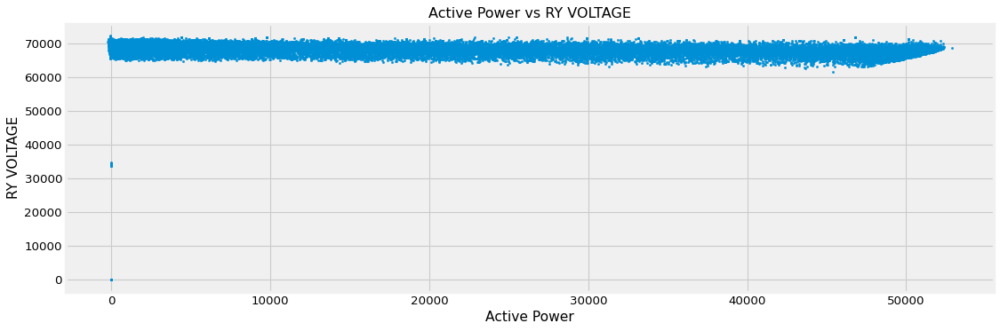

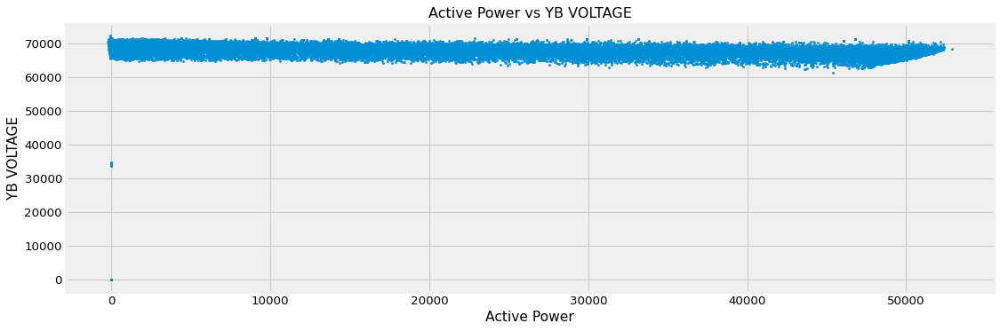

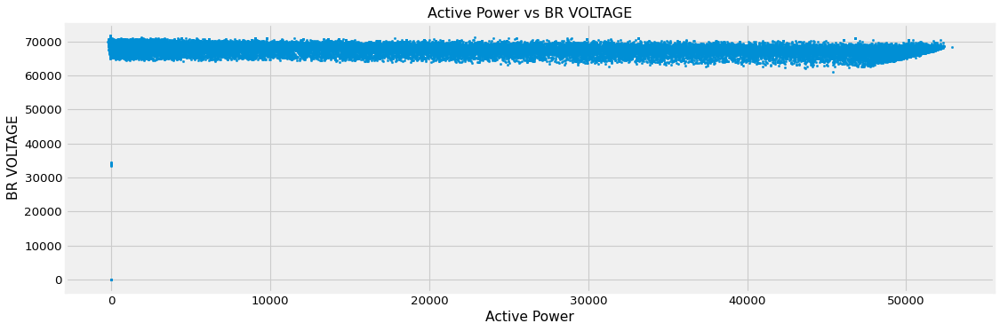

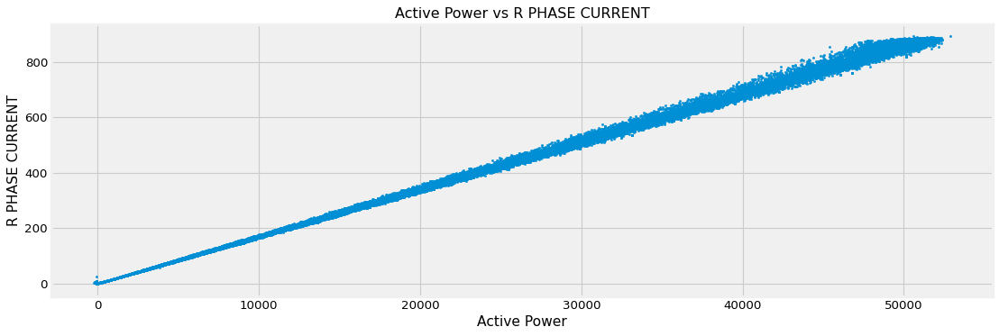

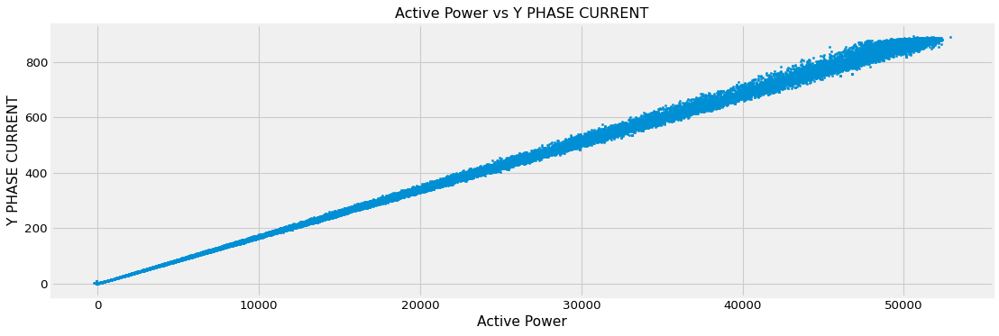

...

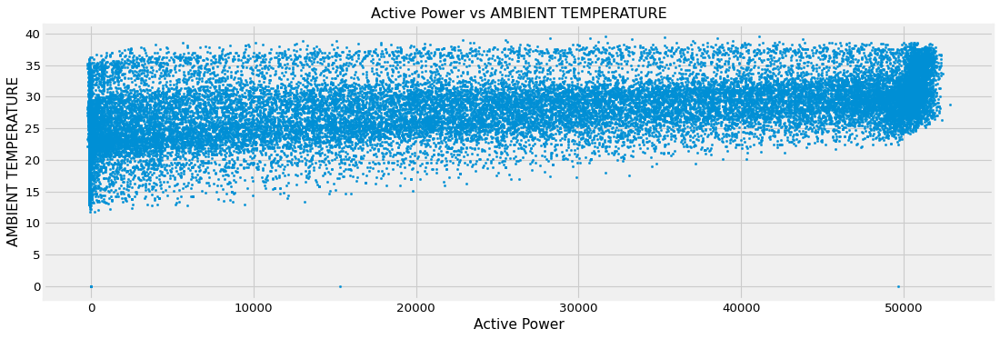

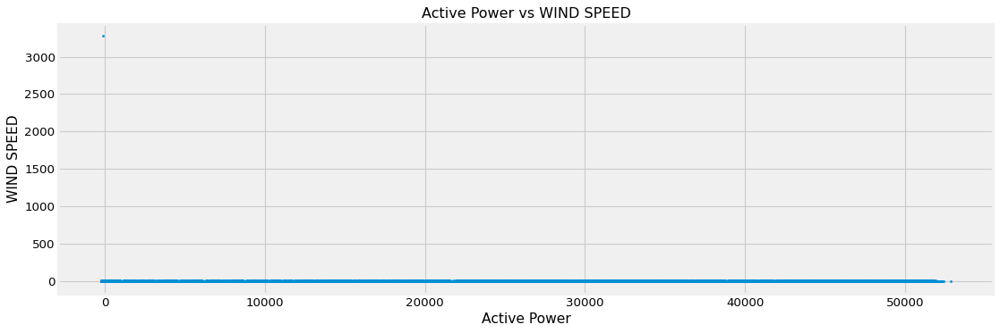

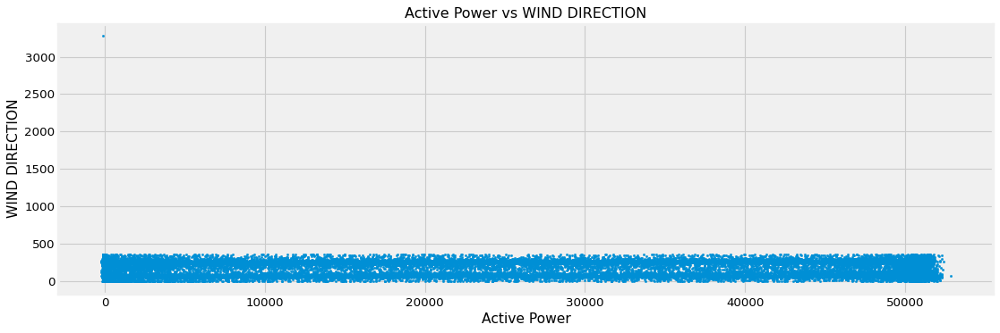

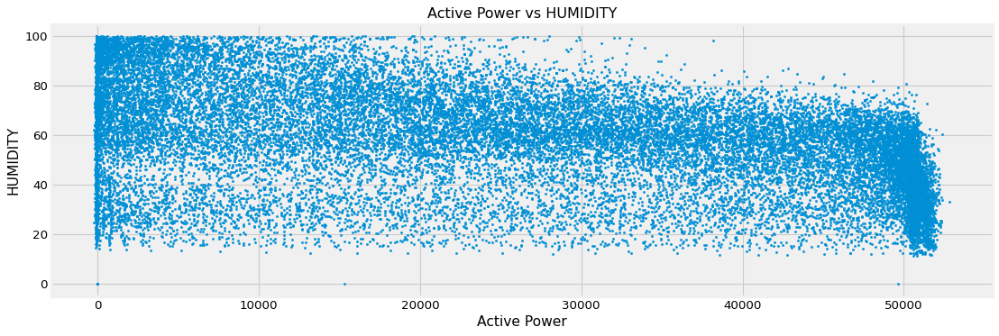

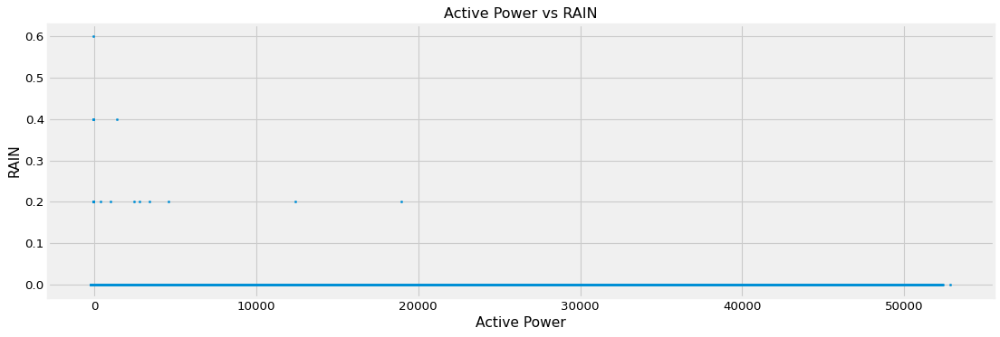

In [129]:
for col_name in data.columns:
  #Line_Chart(col_name,data[col_name])
  Scatter_Plot_ActivePowervsAll(col_name,data['ACTIVE POWER'],data[col_name])